# Benchmarking

This notebook benchmarks 5 algorithms on a ASC dataset for constrained neural networks training and is divided as follows: 

##### Deterministic Constraints:
1. Unconstrained Optimization Adam
2. [SSL-ALM](https://arxiv.org/abs/2504.07607) (Adam + SGD)
3. [Switching Subgradient](https://arxiv.org/abs/2301.13314) 
4. [Cooper](https://github.com/cooper-org/cooper?tab=readme-ov-file) (ALM version)
5. [CHOP](https://github.com/openopt/chop)

##### Stochastic Constraints:
1. Unconstrained Optimization Adam
2. [SSL-ALM](https://arxiv.org/abs/2504.07607) (Adam + SGD)
3. [Switching Subgradient](https://arxiv.org/abs/2301.13314) 
4. [Cooper](https://github.com/cooper-org/cooper?tab=readme-ov-file) (ALM version)

##### Importance Sampling:
1. Train a model using the SSL-ALM with balanced sampling over groups (each subgroups has equal number of samples in each batch),
2. Train a model using the SSL-ALM without a balanced sampling over groups.


<br>

-------------------------------------------------------------------------------



# Prepare data - folktables

In [ ]:
# load and prepare data
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import torch
import numpy as np
from folktables import ACSDataSource, ACSIncome, generate_categories

seed_n = 1

# load folktables data
data_source = ACSDataSource(survey_year="2018", horizon="1-Year", survey="person")
acs_data = data_source.get_data(states=["VA"], download=True)
definition_df = data_source.get_definitions(download=True)
categories = generate_categories(
    features=ACSIncome.features, definition_df=definition_df
)
df_feat, df_labels, _ = ACSIncome.df_to_pandas(
    acs_data, categories=categories, dummies=True
)
sens_cols = ["SEX_Female", "SEX_Male"]
features = df_feat.drop(columns=sens_cols).to_numpy(dtype="float")
groups = df_feat[sens_cols].to_numpy(dtype="float")
labels = df_labels.to_numpy(dtype="float")

print(sens_cols)
print(features.shape)
print(groups.shape)
print(labels.shape)
# set the same seed for fair comparisons
torch.manual_seed(seed_n)

# split
X_train, X_test, y_train, y_test, groups_train, groups_test = train_test_split(
    features, labels, groups, test_size=0.2, random_state=42
)

# scale
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# make into a pytorch dataset, remove the sensitive attribute
features_train = torch.tensor(X_train, dtype=torch.float)
labels_train = torch.tensor(y_train, dtype=torch.float)
sens_train = torch.tensor(groups_train)
dataset_train = torch.utils.data.TensorDataset(features_train, labels_train)

features_test = torch.tensor(X_test, dtype=torch.float)
labels_test = torch.tensor(y_test, dtype=torch.float)
sens_test = torch.tensor(groups_test)
dataset_test = torch.utils.data.TensorDataset(features_test, labels_test)

['SEX_Female', 'SEX_Male']
(46144, 800)
(46144, 2)
(46144, 1)


Now we prepare stuff for the wrappers that we can use for most fairness benchmarking tasks:

In [ ]:
### SETUP FOR BENCHMARK TASK - common elements for all optimizers
from humancompatible.train.benchmark.algorithms.optim_wrapper import OptimLoopWrapper
from humancompatible.train.fairness.utils import BalancedBatchSampler
from torch.nn import Sequential
import torch

seed_n = 1

latent_size1 = 64
latent_size2 = 32
def create_model():
    model = Sequential(
        torch.nn.Linear(features_train.shape[1], latent_size1),
        torch.nn.ReLU(),
        torch.nn.Linear(latent_size1, latent_size2),
        torch.nn.ReLU(),
        torch.nn.Linear(latent_size2, 1),
    )    
    return model

torch.manual_seed(seed_n)
criterion = torch.nn.BCEWithLogitsLoss()

# forward function: expects to have (model, batch) as arguments
def fwd_unconstrained(model, batch):
    batch_inputs, _, batch_labels = batch
    logits = model(batch_inputs)
    loss = criterion(logits, batch_labels)
    return loss

def fwd_constrained(model, batch, constraint_fn, bounds, slack_vars = None):
    if slack_vars is not None:
        with torch.no_grad():
            for s in slack_vars:
                if s < 0:
                    s.zero_()
    batch_inputs, batch_sens, batch_labels = batch
    logits = model(batch_inputs)
    loss = criterion(logits, batch_labels)
    constraints = constraint_fn(logits, batch_sens, batch_labels)
    if slack_vars is not None:
        constraints_bounded_eq = [(con - bounds[i] + slack_vars[i]).to(torch.float) for i, con in enumerate(constraints)]
    else:
        constraints_bounded_eq = [torch.max(con - bounds[i], torch.zeros_like(con)).to(torch.float) for i, con in enumerate(constraints)]
    return loss, constraints_bounded_eq


# ssw has an old api, so need to redefine some stuff
def fwd_ssw(model, batch, bounds, constraint_fn):
    batch_inputs, batch_sens, batch_labels = batch
    logits = model(batch_inputs)
    loss = criterion(logits, batch_labels)
    constraints = constraint_fn(logits, batch_sens, batch_labels)
    constraints_bounded_eq = max([con - bounds[i] for i, con in enumerate(constraints)])
    return loss, constraints_bounded_eq

def train_iter_ssw(optimizer, model, batch, bounds, constraint_fn):
    loss, constraint = fwd_ssw(model, batch, bounds, constraint_fn)
    constraint.backward(retain_graph=True)
    optimizer.dual_step(0)
    optimizer.zero_grad()

    loss.backward()
    optimizer.step(constraint)
    optimizer.zero_grad(set_to_none=True)



# define the cooper iteration
def train_iter_cooper(optimizer, model, batch, problem, penalty_scheduler):
    compute_cmp_state_kwargs = {
        "model": model,
        "batch": batch
    }
    roll_out = optimizer.roll(
        compute_cmp_state_kwargs=compute_cmp_state_kwargs
    )
    constraint_state = roll_out.cmp_state.observed_constraints[problem.constraint]
    penalty_scheduler.update_penalty_coefficient_(
        problem.constraint, constraint_state
    )


# eval function that evaluates loss and constraints without keeping track of gradients 
# and without transforming constraints to equality 
@torch.inference_mode
def eval(model, batch, constraint_fn):
    inputs, sens, labels = batch
    logits = model(inputs)
    loss = criterion(logits, labels)
    constraints = constraint_fn(logits, sens, labels)
    constraints = [c.detach().numpy().item() for c in constraints]
    return loss.detach().numpy().item(), constraints

# Stochastic constraints: ACSIncome - Uniform Positive Rate 

To benchmark the stochastic constraints, we define the regression problem for binary classification of income above a threshold as

\begin{aligned}
& \min_{x \in \mathbb{R}^n} \; \mathbb{E}[f(x,\xi)] \\
& \text{s.t.} \quad \mathbb{E}[c(x,\zeta)] \le 0, \quad
\end{aligned}

where the $f: \mathbb{R}^n \times Ξ \rightarrow \mathbb{R}$ is a loss, the constraint $c : \mathbb{R}^n \times Z \rightarrow \mathbb{R}$ is a norm of positive rate fair metric among the sensitive groups of $S = \{$ man, woman $\}$, of size $k=2$. That is, we aim to have an unbiased regression model $g$ that has the property of

\begin{aligned}
\forall S_k \in S :\; P\big(g(x, \zeta_i) = 1 \mid S_k = 1\big)
= P\big(g(x, \zeta_i) = 1\big).
\end{aligned}

Such statistics gives us a violation vector $\bold{v} \in \mathbb{R}^k$, we define the constraint as $c(x, \zeta) = || \bold{v}(x, \zeta) ||_p$. We choose a Manhatton $p=1$. For more details about the fairness metrics see [Fairret](https://openreview.net/pdf?id=NnyD0Rjx2B). Such model should be good at classification while maintaining the fairness among sensitive demographics groups.


Here, let's define a benchmarking class and functions that we can use for most stochastic fairness constraints.

Now define task-specific stuff: constraint, data,...

In [ ]:
# Define the constraint function for this task
# i.e. f-n that calculates the value that we'll be constraining
from fairret.statistic import PositiveRate
from fairret.loss import NormLoss
from humancompatible.train.fairness.utils import BalancedBatchSampler

statistic = PositiveRate()
fair_criterion = NormLoss(statistic=statistic)
fair_crit_bound = 0.2  # define the bound on the criterion

# function to calculate the constraints
def fairret_posrate_constraint(out, sens, labels):
    return [fair_criterion(out, sens)]

dataset = torch.utils.data.TensorDataset(features_train, sens_train, labels_train)
sampler = BalancedBatchSampler(
    group_onehot=sens_train, batch_size=128, drop_last=True
)
dataloader = torch.utils.data.DataLoader(dataset, batch_sampler=sampler)
n_runs = 2
n_epochs = 40

Start!

In [ ]:
# Adam
adam_logs = []
for run in range(n_runs):
    model = create_model()
    # first backward pass sometimes takes ages
    model(features_train[0]).backward()
    model.zero_grad()

    optimizer = torch.optim.Adam(
        params=model.parameters(),
        lr=0.001,
    )

    adam = OptimLoopWrapper(
        model = model,
        fwd = fwd_unconstrained,
        eval = lambda model, batch: eval(model, batch, fairret_posrate_constraint),
        train_data = dataloader,
        eval_data = {'train': (features_train, sens_train, labels_train), 'val': (features_test, sens_test, labels_test)},
        optimizer = optimizer,
        use_vanilla_torch=True,
        verbose=False
    )

    adam.training_loop(epochs=n_epochs, max_iter=np.inf, max_runtime=np.inf, eval_every='epoch', save_every=-1)
    adam_logs.append(adam.history)

In [ ]:
# SSL-ALM with Max
from humancompatible.train.optim import SSLALM

alm_max_logs = []
for run in range(n_runs):
    model = create_model()
    # first backward pass sometimes takes ages
    model(features_train[0]).backward()
    model.zero_grad()

    optimizer = SSLALM(
        params=model.parameters(),
        m=1,  # number of constraints - one in our case
        lr=0.1,  # primal variable lr
        dual_lr=0.05,  # lr of a dual ALM variable
        dual_bound=5,
        rho=1,  # rho penalty in ALM parameter
        mu=2,  # smoothing parameter
    )

    sslalm_max = OptimLoopWrapper(
        model = model,
        fwd = lambda model, batch: fwd_constrained(model, batch, fairret_posrate_constraint, [fair_crit_bound]),
        eval = lambda model, batch: eval(model, batch, fairret_posrate_constraint),
        train_data = dataloader,
        eval_data = {'train': (features_train, sens_train, labels_train), 'val': (features_test, sens_test, labels_test)},
        optimizer = optimizer,
        use_vanilla_torch=False,
        verbose=False
    )

    sslalm_max.training_loop(epochs=n_epochs, max_iter=np.inf, max_runtime=np.inf, eval_every='epoch', save_every=-1)
    alm_max_logs.append(sslalm_max.history)

In [ ]:
# SSL-ALM with Slacks
from humancompatible.train.optim import SSLALM

alm_slack_logs = []
for run in range(n_runs):
    model = create_model()
    # first backward pass sometimes takes ages
    model(features_train[0]).backward()
    model.zero_grad()

    optimizer = SSLALM(
        params=model.parameters(),
        m=1,  # number of constraints - one in our case
        lr=0.1,  # primal variable lr
        dual_lr=0.05,  # lr of a dual ALM variable
        dual_bound=5,
        rho=1,  # rho penalty in ALM parameter
        mu=2,  # smoothing parameter
    )

    # # add slack variables - to create the equality from the inequalities
    slack_vars = torch.zeros(1, requires_grad=True)
    optimizer.add_param_group(param_group={"params": slack_vars, "name": "slack"})

    sslalm_slack = OptimLoopWrapper(
        model = model,
        fwd = lambda model, batch: fwd_constrained(model, batch, fairret_posrate_constraint, [fair_crit_bound], slack_vars),
        eval = lambda model, batch: eval(model, batch, fairret_posrate_constraint),
        train_data = dataloader,
        eval_data = {'train': (features_train, sens_train, labels_train), 'val': (features_test, sens_test, labels_test)},
        optimizer = optimizer,
        use_vanilla_torch=False,
        verbose=False
    )

    sslalm_slack.training_loop(epochs=n_epochs, max_iter=np.inf, max_runtime=np.inf, eval_every='epoch', save_every=-1)
    alm_slack_logs.append(sslalm_slack.history)    return loss.detach().numpy().item(), constraints

In [ ]:
# SSL-ALM-Adam with Max
from humancompatible.train.optim import SSLALM_Adam

alm_adam_max_logs = []
for run in range(n_runs):
    model = create_model()
    # first backward pass sometimes takes ages
    model(features_train[0]).backward()
    model.zero_grad()

    optimizer = SSLALM_Adam(
        params=model.parameters(),
        m=1,  # number of constraints - one in our case
        lr=0.1,  # primal variable lr
        dual_lr=0.05,  # lr of a dual ALM variable
        dual_bound=5,
        rho=1,  # rho penalty in ALM parameter
        mu=2,  # smoothing parameter
    )

    sslalm_adam_max = OptimLoopWrapper(
        model = model,
        fwd = lambda model, batch: fwd_constrained(model, batch, fairret_posrate_constraint, [fair_crit_bound]),
        eval = lambda model, batch: eval(model, batch, fairret_posrate_constraint),
        train_data = dataloader,
        eval_data = {'train': (features_train, sens_train, labels_train), 'val': (features_test, sens_test, labels_test)},
        optimizer = optimizer,
        use_vanilla_torch = False,
        verbose=False
    )

    sslalm_adam_max.training_loop(epochs=n_epochs, max_iter=np.inf, max_runtime=np.inf, eval_every='epoch', save_every=-1)
    alm_adam_max_logs.append(sslalm_adam_max.history)

In [ ]:
# SSL-ALM-Adam with Slacks
from humancompatible.train.optim import SSLALM_Adam

alm_adam_slack_logs = []
for run in range(n_runs):
    model = create_model()
    # first backward pass sometimes takes ages
    model(features_train[0]).backward()
    model.zero_grad()

    optimizer = SSLALM_Adam(
        params=model.parameters(),
        m=1,  # number of constraints - one in our case
        lr=0.1,  # primal variable lr
        dual_lr=0.05,  # lr of a dual ALM variable
        dual_bound=5,
        rho=1,  # rho penalty in ALM parameter
        mu=2,  # smoothing parameter
    )
    
    # add slack variables - to create the equality from the inequalities
    slack_vars = torch.zeros(1, requires_grad=True)
    optimizer.add_param_group(param_group={"params": slack_vars, "name": "slack"})

    sslalm_adam_slack = OptimLoopWrapper(
        model = model,
        fwd = lambda model, batch: fwd_constrained(model, batch, fairret_posrate_constraint, [fair_crit_bound], slack_vars),
        eval = lambda model, batch: eval(model, batch, fairret_posrate_constraint),
        train_data = dataloader,
        eval_data = {'train': (features_train, sens_train, labels_train), 'val': (features_test, sens_test, labels_test)},
        optimizer = optimizer,
        use_vanilla_torch=False,
        verbose=False
    )

    sslalm_adam_slack.training_loop(epochs=n_epochs, max_iter=np.inf, max_runtime=np.inf, eval_every='epoch', save_every=-1)
    alm_adam_slack_logs.append(sslalm_adam_slack.history)

In [ ]:
# SSw
from humancompatible.train.optim import SSG

ssw_logs = []
for run in range(n_runs):
    model = create_model()
    # first backward pass sometimes takes ages
    model(features_train[0]).backward()
    model.zero_grad()

    optimizer = SSG(
        params=model.parameters(),
        m=1,  # number of constraints - one in our case
        lr=0.2,  # primal variable lr
        dual_lr=0.2,  # lr of a dual ALM variable
    )

    ssw = OptimLoopWrapper(
        model = model,
        train_iter=lambda optimizer, model, batch: train_iter_ssw(optimizer, model,  batch, [fair_crit_bound], constraint_fn = fairret_posrate_constraint),
        fwd = None,
        eval = lambda model, batch: eval(model, batch, fairret_posrate_constraint),
        train_data = dataloader,
        eval_data = {'train': (features_train, sens_train, labels_train), 'val': (features_test, sens_test, labels_test)},
        optimizer = optimizer,
        use_vanilla_torch=False,
        verbose=False
    )

    ssw.training_loop(epochs=n_epochs, max_iter=np.inf, max_runtime=np.inf, eval_every='epoch', save_every=-1)
    ssw_logs.append(ssw.history)

cooper


In [ ]:
import cooper

class ACS_PosRateLoss(cooper.ConstrainedMinimizationProblem):
    def __init__(self, formulation_type):
        super().__init__()
        self.multiplier = cooper.multipliers.DenseMultiplier(num_constraints=1)
        self.penalty = cooper.penalty_coefficients.DensePenaltyCoefficient(init=torch.tensor(1.0))
        self.constraint = cooper.Constraint(
            constraint_type=cooper.ConstraintType.INEQUALITY,
            formulation_type=formulation_type,
            multiplier=self.multiplier,
            penalty_coefficient=self.penalty,
        )
    # function that computes the constraints and the loss function
    def compute_cmp_state(self, model, batch):
        batch_inputs, batch_sens, batch_labels = batch
        logits = model(batch_inputs)
        loss = criterion(logits, batch_labels)
        # compute fair metric
        fair_loss = fair_criterion(logits, batch_sens)
        fair_constraint = fair_loss - fair_crit_bound
        # compute the constraint violation
        constraint_state = cooper.ConstraintState(violation=fair_constraint)
        observed_constraints = {self.constraint: constraint_state}
        return cooper.CMPState(loss=loss, observed_constraints=observed_constraints)

cooper_logs = []
for run in range(n_runs):
    model = create_model()
    # first backward pass sometimes takes ages
    model(features_train[0]).backward()
    model.zero_grad()

    # create the problem
    problem = ACS_PosRateLoss(cooper.formulations.AugmentedLagrangian)
    has_dual_variables = problem.multiplier is not None                                     # flag of dual variables
    primal_optimizer = torch.optim.Adam(model.parameters(), lr=0.01)                        # create the primal optimizer
    dual_optimizer = torch.optim.SGD(problem.dual_parameters(), lr=0.05, maximize=True)     # create the dual optimizer
    constrained_optimizer = cooper.optim.SimultaneousOptimizer(                             # combine the optimizers
        cmp=problem,
        primal_optimizers=primal_optimizer,
        dual_optimizers=dual_optimizer,
    )
    penalty_scheduler = cooper.penalty_coefficients.AdditivePenaltyCoefficientUpdater(
        increment=0.0,
        violation_tolerance=1e-3,
    )

    coop = OptimLoopWrapper(
        model = model,
        train_iter=lambda optimizer, model, batch: train_iter_cooper(optimizer, model, batch, problem, penalty_scheduler),
        fwd = None,
        eval = lambda model, batch: eval(model, batch, fairret_posrate_constraint),
        train_data = dataloader,
        eval_data = {'train': (features_train, sens_train, labels_train), 'val': (features_test, sens_test, labels_test)},
        optimizer = constrained_optimizer,
        use_vanilla_torch=False,
        verbose=False
    )

    coop.training_loop(epochs=n_epochs, max_iter=np.inf, max_runtime=np.inf, eval_every='epoch', save_every=-1)
    cooper_logs.append(coop.history)

PBM

In [ ]:
# PBM with Slacks
from humancompatible.train.optim.PBM import PBM

pbm_slack_logs = []
for run in range(n_runs):
    model = create_model()
    # first backward pass sometimes takes ages
    model(features_train[0]).backward()
    model.zero_grad()

    optimizer = PBM(
        params=model.parameters(),
        m=1,
        lr=0.001,
        dual_beta=0.95,
        mu=0.1,
        penalty_update_m='CONST',
        barrier="quadratic_logarithmic"
    )
    
    # add slack variables - to create the equality from the inequalities
    slack_vars = torch.zeros(1, requires_grad=True)
    optimizer.add_param_group(param_group={"params": slack_vars, "name": "slack"})

    pbm_slack = OptimLoopWrapper(
        model = model,
        fwd = lambda model, batch: fwd_constrained(model, batch, fairret_posrate_constraint, [fair_crit_bound], slack_vars),
        eval = lambda model, batch: eval(model, batch, fairret_posrate_constraint),
        train_data = dataloader,
        eval_data = {'train': (features_train, sens_train, labels_train), 'val': (features_test, sens_test, labels_test)},
        optimizer = optimizer,
        use_vanilla_torch=False,
        verbose=False
    )

    pbm_slack.training_loop(epochs=n_epochs, max_iter=np.inf, max_runtime=np.inf, eval_every='epoch', save_every=-1)
    pbm_slack_logs.append(pbm_slack.history)

In [ ]:
logs = [adam_logs, alm_slack_logs, alm_max_logs, alm_adam_slack_logs, alm_adam_max_logs, ssw_logs, pbm_slack_logs, cooper_logs]

In [ ]:
from bench_utils import get_log_arrays

(losses_train, losses_train_mean, losses_train_std), (constraints_train, constraints_train_mean, constraints_train_std) = get_log_arrays(logs, subset='train')
(losses_val, losses_val_mean, losses_val_std), (constraints_val, constraints_val_mean, constraints_val_std) = get_log_arrays(logs, subset='val')

Results over 2 runs:


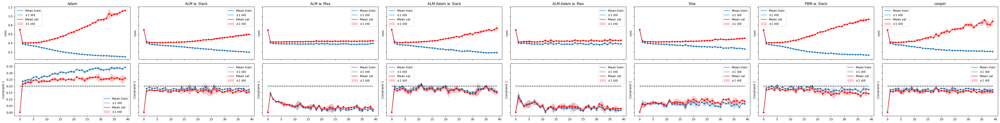

In [ ]:
from bench_utils import plot_mean_std

print(f'Results over {n_runs} runs:')

f, ax = plot_mean_std(
    losses_train_mean,
    losses_train_std,
    constraints_train_mean,
    constraints_train_std,
    bounds = [0.2],
    titles=['Adam', 'ALM w. Slack', 'ALM w. Max', 'ALM-Adam w. Slack', 'ALM-Adam w. Max', 'SSw', 'PBM w. Slack', 'cooper',],
    subset='train'
)
f, ax = plot_mean_std(
    losses_val_mean,
    losses_val_std,
    constraints_val_mean,
    constraints_val_std,
    bounds = [fair_crit_bound],
    titles=['Adam', 'ALM w. Slack', 'ALM w. Max', 'ALM-Adam w. Slack', 'ALM-Adam w. Max', 'SSw', 'PBM w. Slack', 'cooper'],
    figure=(f, ax),
    color='red',
    subset='val'
)

It is interesting to see that in the stochastic case, the constraints are not as restrictive as in the deterministic case, directly implying the small difference in the loss between the Unconstrained Adam and the best constrained SSL-ALM-Adam.

# Stochastic Constraints: ACSIncome - Equal Opportunity

TODO: add test constr + loss

To benchmark a more complicated problem, we define the regression problem for binary classification of income above a threshold as

\begin{aligned}
& \min_{x \in \mathbb{R}^n} \; \mathbb{E}[f(x,\xi)] \\
& \text{s.t.} \quad \mathbb{E}[c(x,\zeta)] \le 0, \quad
\end{aligned}

where the $f: \mathbb{R}^n \times Ξ \rightarrow \mathbb{R}$ is a loss, the constraint $c : \mathbb{R}^n \times Z \rightarrow \mathbb{R}^m$ is the equal opportunity of the sensitive groups of $S = \{$ man, woman, (married / divorced / single) $\}$ of size $k$. That is, we aim to have an unbiased regression model $g$ that has the property of

\begin{aligned}
\forall S_k, S_j \in S, S_j \neq S_k :\; | \mathbb{E}\big(g(x, \zeta_i) = 1 \mid S_k = 1\big) - \mathbb{E}\big(g(x, \zeta_i) = 1\mid S_j = 1\big)| \leq \epsilon.
\end{aligned}

The number of constraints in this case is of order $\mathcal{O}(k^2)$. Concretely, $k=6$ and so $m=30$. 

In [ ]:
import torch

# define the torch seed here
seed_n = 1
n_epochs = 60

# set the same seed for fair comparisons
torch.manual_seed(seed_n)

# log path file
log_path = "./data/logs/log_benchmark_stochastic_2.npz"

Remake the data:

In [ ]:
# load and prepare data
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import torch
import numpy as np
from folktables import ACSDataSource, ACSIncome, generate_categories
from itertools import product

# load folktables data
data_source = ACSDataSource(survey_year="2018", horizon="1-Year", survey="person")
acs_data = data_source.get_data(states=["VA"], download=True)
definition_df = data_source.get_definitions(download=True)
categories = generate_categories(
    features=ACSIncome.features, definition_df=definition_df
)
df_feat, df_labels, _ = ACSIncome.df_to_pandas(
    acs_data, categories=categories, dummies=True
)

# split the data on groups, labels and features - the features should not have the sensitive feature
sens_cols = [
    "SEX_Female",
    "SEX_Male",
    "MAR_Divorced",
    "MAR_Married",
    "MAR_Never married or under 15 years old",
]
features = df_feat.drop(columns=sens_cols).to_numpy(dtype="float")
groups = df_feat[sens_cols].to_numpy(dtype="float")
labels = df_labels.to_numpy(dtype="float")

# Split columns into sex and marital
sex_cols = ["SEX_Female", "SEX_Male"]
mar_cols = [
    "MAR_Divorced",
    "MAR_Married",
    "MAR_Never married or under 15 years old",
]

# Convert each row to sex index and marital index
sex_idx = df_feat[sex_cols].values.argmax(axis=1)
mar_idx = df_feat[mar_cols].values.argmax(axis=1)

# Number of unique combinations
num_groups = len(sex_cols) * len(mar_cols)

# Map each combination to a unique index
group_indices = sex_idx * len(mar_cols) + mar_idx  # shape: (num_samples,)

# One-hot encode the combinations
groups_onehot = np.eye(num_groups)[group_indices]

# Create dictionary mapping index to combination
group_dict = {}
for i, (s, m) in enumerate(product(sex_cols, mar_cols)):
    group_dict[i] = f"{s} + {m}"

# set the same seed for fair comparisons
torch.manual_seed(seed_n)

# split
X_train, X_test, y_train, y_test, groups_train, groups_test = train_test_split(
    features, labels, groups_onehot, test_size=0.2, random_state=42
)

# scale
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
# print the statistics
for idx in group_dict:
    print(f"{group_dict[idx]}, : {(groups_onehot[:, idx] == 1).sum()}")

SEX_Female + MAR_Divorced, : 3823
SEX_Female + MAR_Married, : 11939
SEX_Female + MAR_Never married or under 15 years old, : 6548
SEX_Male + MAR_Divorced, : 2496
SEX_Male + MAR_Married, : 14122
SEX_Male + MAR_Never married or under 15 years old, : 7216


In [ ]:
# make into a pytorch dataset, remove the sensitive attribute
features_train = torch.tensor(X_train, dtype=torch.float)
labels_train = torch.tensor(y_train, dtype=torch.float)
sens_train = torch.tensor(groups_train)
dataset_train = torch.utils.data.TensorDataset(features_train, sens_train, labels_train)

# make into a pytorch dataset, remove the sensitive attribute
features_test = torch.tensor(X_test, dtype=torch.float)
labels_test = torch.tensor(y_test, dtype=torch.float)
sens_test = torch.tensor(groups_test)
dataset_test = torch.utils.data.TensorDataset(features_test, sens_test, labels_test)

In [ ]:
### SETUP FOR BENCHMARK TASK - common elements for all optimizers
from humancompatible.train.benchmark.algorithms.optim_wrapper import OptimLoopWrapper
from humancompatible.train.fairness.utils import BalancedBatchSampler
from torch.nn import Sequential
import torch


latent_size1 = 64
latent_size2 = 32
def create_model():
    model = Sequential(
        torch.nn.Linear(features_train.shape[1], latent_size1),
        torch.nn.ReLU(),
        torch.nn.Linear(latent_size1, latent_size2),
        torch.nn.ReLU(),
        torch.nn.Linear(latent_size2, 1),
    )    
    return model


from fairret.statistic.linear_fractional import PositiveRate
def positive_rate(out_batch, batch_sens, prob_f=torch.nn.functional.sigmoid):
    """
    Calculates the positive rate vector based on the given outputs of the model for the given groups. 
    
    """
    if prob_f is None: 
        preds = out_batch
    else: 
        preds = prob_f( out_batch )
    pr = PositiveRate()
    probs_per_group = pr(preds, batch_sens)  # P(y=1|Sk = 1)
    return probs_per_group

m = 30 # number of constraints
torch.manual_seed(seed_n)
criterion = torch.nn.BCEWithLogitsLoss()
bounds = [0.1]*m

# create a balanced sampling - needed for an unbiased gradient
sampler = BalancedBatchSampler(
    group_onehot=sens_train, batch_size=120, drop_last=True,extend_groups=[0,2,3,5]
)
dataloader = torch.utils.data.DataLoader(dataset_train, batch_sampler=sampler)

# function to calculate the constraints
def groupwise_posrate_constraint(out, batch_sens, batch_labels):
    pos_rate_pergroup = positive_rate(out, batch_sens, prob_f=torch.nn.functional.sigmoid)
    # compute the equal opportunity constraint
    constraints = []
    current_constr = 0
    for i in range(0, len(pos_rate_pergroup)):
        for j in range(0, len(pos_rate_pergroup)):
            if i != j:
                constr_ij = pos_rate_pergroup[i] - pos_rate_pergroup[j]
                constraints.append(constr_ij)
                current_constr += 1
    return constraints

In [ ]:
# SSL-ALM with Max
from humancompatible.train.optim import SSLALM

alm_max_logs = []
for run in range(n_runs):
    model = create_model()
    # first backward pass sometimes takes ages
    model(features_train[0]).backward()
    model.zero_grad()

    optimizer = SSLALM(
        params=model.parameters(),
        m=m,
        lr=0.1,  # primal variable lr
        dual_lr=0.05,  # lr of a dual ALM variable
        dual_bound=5,
        rho=1,  # rho penalty in ALM parameter
        mu=2,  # smoothing parameter
    )

    sslalm_max = OptimLoopWrapper(
        model = model,
        fwd = lambda model, batch: fwd_constrained(model, batch, groupwise_posrate_constraint, bounds),
        eval = lambda model, batch: eval(model, batch, groupwise_posrate_constraint),
        train_data = dataloader,
        eval_data = {'train': (features_train, sens_train, labels_train), 'val': (features_test, sens_test, labels_test)},
        optimizer = optimizer,
        use_vanilla_torch=False,
        verbose=False
    )

    sslalm_max.training_loop(epochs=n_epochs, max_iter=np.inf, max_runtime=np.inf, eval_every='epoch', save_every=-1)
    alm_max_logs.append(sslalm_max.history)

In [ ]:
# SSL-ALM with Slacks
from humancompatible.train.optim import SSLALM

alm_slack_logs = []
for run in range(n_runs):
    model = create_model()
    # first backward pass sometimes takes ages
    model(features_train[0]).backward()
    model.zero_grad()

    optimizer = SSLALM(
        params=model.parameters(),
        m=m,  # number of constraints - one in our case
        lr=0.1,  # primal variable lr
        dual_lr=0.05,  # lr of a dual ALM variable
        dual_bound=5,
        rho=1,  # rho penalty in ALM parameter
        mu=2,  # smoothing parameter
    )

    # # add slack variables - to create the equality from the inequalities
    slack_vars = torch.zeros(m, requires_grad=True)
    optimizer.add_param_group(param_group={"params": slack_vars, "name": "slack"})

    sslalm_slack = OptimLoopWrapper(
        model = model,
        fwd = lambda model, batch: fwd_constrained(model, batch, groupwise_posrate_constraint, bounds, slack_vars),
        eval = lambda model, batch: eval(model, batch, groupwise_posrate_constraint),
        train_data = dataloader,
        eval_data = {'train': (features_train, sens_train, labels_train), 'val': (features_test, sens_test, labels_test)},
        optimizer = optimizer,
        use_vanilla_torch=False,
        verbose=False
    )

    sslalm_slack.training_loop(epochs=n_epochs, max_iter=np.inf, max_runtime=np.inf, eval_every='epoch', save_every=-1)
    alm_slack_logs.append(sslalm_slack.history)

In [ ]:
# SSL-ALM-Adam with Max
from humancompatible.train.optim import SSLALM_Adam

alm_adam_max_logs = []
for run in range(n_runs):
    model = create_model()
    # first backward pass sometimes takes ages
    model(features_train[0]).backward()
    model.zero_grad()

    optimizer = SSLALM_Adam(
        params=model.parameters(),
        m=m,  # number of constraints - one in our case
        lr=0.1,  # primal variable lr
        dual_lr=0.05,  # lr of a dual ALM variable
        dual_bound=5,
        rho=1,  # rho penalty in ALM parameter
        mu=2,  # smoothing parameter
    )

    sslalm_adam_max = OptimLoopWrapper(
        model = model,
        fwd = lambda model, batch: fwd_constrained(model, batch, groupwise_posrate_constraint, bounds),
        eval = lambda model, batch: eval(model, batch, groupwise_posrate_constraint),
        train_data = dataloader,
        eval_data = {'train': (features_train, sens_train, labels_train), 'val': (features_test, sens_test, labels_test)},
        optimizer = optimizer,
        use_vanilla_torch = False,
        verbose=False
    )

    sslalm_adam_max.training_loop(epochs=n_epochs, max_iter=np.inf, max_runtime=np.inf, eval_every='epoch', save_every=-1)
    alm_adam_max_logs.append(sslalm_adam_max.history)

In [ ]:
# SSL-ALM-Adam with Slacks
from humancompatible.train.optim import SSLALM_Adam

alm_adam_slack_logs = []
for run in range(n_runs):
    model = create_model()
    # first backward pass sometimes takes ages
    model(features_train[0]).backward()
    model.zero_grad()

    optimizer = SSLALM_Adam(
        params=model.parameters(),
        m=m,  # number of constraints - one in our case
        lr=0.1,  # primal variable lr
        dual_lr=0.05,  # lr of a dual ALM variable
        dual_bound=5,
        rho=1,  # rho penalty in ALM parameter
        mu=2,  # smoothing parameter
    )
    
    # add slack variables - to create the equality from the inequalities
    slack_vars = torch.zeros(m, requires_grad=True)
    optimizer.add_param_group(param_group={"params": slack_vars, "name": "slack"})

    sslalm_adam_slack = OptimLoopWrapper(
        model = model,
        fwd = lambda model, batch: fwd_constrained(model, batch, groupwise_posrate_constraint, bounds, slack_vars),
        eval = lambda model, batch: eval(model, batch, groupwise_posrate_constraint),
        train_data = dataloader,
        eval_data = {'train': (features_train, sens_train, labels_train), 'val': (features_test, sens_test, labels_test)},
        optimizer = optimizer,
        use_vanilla_torch=False,
        verbose=False
    )

    sslalm_adam_slack.training_loop(epochs=n_epochs, max_iter=np.inf, max_runtime=np.inf, eval_every='epoch', save_every=-1)
    alm_adam_slack_logs.append(sslalm_adam_slack.history)

In [ ]:
# SSw
from humancompatible.train.optim import SSG

ssw_logs = []
for run in range(n_runs):
    model = create_model()
    # first backward pass sometimes takes ages
    model(features_train[0]).backward()
    model.zero_grad()

    optimizer = SSG(
        params=model.parameters(),
        m=1,  # number of constraints - one in our case
        lr=0.2,  # primal variable lr
        dual_lr=0.2,  # lr of a dual ALM variable
    )

    ssw = OptimLoopWrapper(
        model = model,
        train_iter=lambda optimizer, model, batch: train_iter_ssw(optimizer, model,  batch, bounds, constraint_fn = groupwise_posrate_constraint),
        fwd = None,
        eval = lambda model, batch: eval(model, batch, groupwise_posrate_constraint),
        train_data = dataloader,
        eval_data = {'train': (features_train, sens_train, labels_train), 'val': (features_test, sens_test, labels_test)},
        optimizer = optimizer,
        use_vanilla_torch=False,
        verbose=False
    )

    ssw.training_loop(epochs=n_epochs, max_iter=np.inf, max_runtime=np.inf, eval_every='epoch', save_every=-1)
    ssw_logs.append(ssw.history)

PBM

In [ ]:
# PBM
from humancompatible.train.optim.PBM import PBM

pbm_logs = []
for run in range(n_runs):
    model = create_model()
    # first backward pass sometimes takes ages
    model(features_train[0]).backward()
    model.zero_grad()

    optimizer = PBM(
        params=model.parameters(),
        m=m,
        lr=0.001,
        dual_beta=0.95,
        mu=0.1,
        penalty_update_m='CONST',
        barrier="quadratic_logarithmic"
    )
    
    pbm = OptimLoopWrapper(
        model = model,
        fwd = lambda model, batch: fwd_constrained(model, batch, groupwise_posrate_constraint, bounds),
        eval = lambda model, batch: eval(model, batch, groupwise_posrate_constraint),
        train_data = dataloader,
        eval_data = {'train': (features_train, sens_train, labels_train), 'val': (features_test, sens_test, labels_test)},
        optimizer = optimizer,
        use_vanilla_torch=False,
        verbose=False
    )

    pbm.training_loop(epochs=n_epochs, max_iter=np.inf, max_runtime=np.inf, eval_every='epoch', save_every=-1)
    pbm_logs.append(pbm.history)

In [ ]:
logs = [alm_slack_logs, alm_max_logs, alm_adam_slack_logs, alm_adam_max_logs, ssw_logs, pbm_logs]
names = ['ALM w. Slack', 'ALM w. Max', 'ALM-Adam w. Slack', 'ALM-Adam w. Max', 'SSw', 'PBM']

In [ ]:
from bench_utils import get_log_arrays

(losses_train, losses_train_mean, losses_train_std), (constraints_train, constraints_train_mean, constraints_train_std) = get_log_arrays(logs, subset='train')
(losses_val, losses_val_mean, losses_val_std), (constraints_val, constraints_val_mean, constraints_val_std) = get_log_arrays(logs, subset='val')

In [ ]:
from bench_utils import plot_mean_std

print(f'Results over {n_runs} runs:')

f, ax = plot_mean_std(
    losses_train_mean,
    losses_train_std,
    constraints_train_mean,
    constraints_train_std,
    bounds = bounds,
    titles=names,
    subset='train'
)
f, ax = plot_mean_std(
    losses_val_mean,
    losses_val_std,
    constraints_val_mean,
    constraints_val_std,
    bounds = bounds,
    titles=names,
    figure=(f, ax),
    color='red',
    subset='val'
)

f.tight_layout()

Results over 2 runs:
